In [1]:
import tensorflow as tf
import sys

sys.path.append('../')

from src.Objective import Objective
from src.Parameterization import Parameterization, get_fft_scale, fft_to_rgb
from src.Transformation import *
from src.Regularizer import *
from src.Optimizer import *
from src.Miscellaneous import *
from src.Attribution import *
from src.Wrapper import *

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Model selection

In [2]:
# Model names: https://keras.io/api/applications/

model = Wrapper(model = 'MobileNet')

print(model.layers())

['input_1', 'conv1', 'conv1_bn', 'conv1_relu', 'conv_dw_1', 'conv_dw_1_bn', 'conv_dw_1_relu', 'conv_pw_1', 'conv_pw_1_bn', 'conv_pw_1_relu', 'conv_pad_2', 'conv_dw_2', 'conv_dw_2_bn', 'conv_dw_2_relu', 'conv_pw_2', 'conv_pw_2_bn', 'conv_pw_2_relu', 'conv_dw_3', 'conv_dw_3_bn', 'conv_dw_3_relu', 'conv_pw_3', 'conv_pw_3_bn', 'conv_pw_3_relu', 'conv_pad_4', 'conv_dw_4', 'conv_dw_4_bn', 'conv_dw_4_relu', 'conv_pw_4', 'conv_pw_4_bn', 'conv_pw_4_relu', 'conv_dw_5', 'conv_dw_5_bn', 'conv_dw_5_relu', 'conv_pw_5', 'conv_pw_5_bn', 'conv_pw_5_relu', 'conv_pad_6', 'conv_dw_6', 'conv_dw_6_bn', 'conv_dw_6_relu', 'conv_pw_6', 'conv_pw_6_bn', 'conv_pw_6_relu', 'conv_dw_7', 'conv_dw_7_bn', 'conv_dw_7_relu', 'conv_pw_7', 'conv_pw_7_bn', 'conv_pw_7_relu', 'conv_dw_8', 'conv_dw_8_bn', 'conv_dw_8_relu', 'conv_pw_8', 'conv_pw_8_bn', 'conv_pw_8_relu', 'conv_dw_9', 'conv_dw_9_bn', 'conv_dw_9_relu', 'conv_pw_9', 'conv_pw_9_bn', 'conv_pw_9_relu', 'conv_dw_10', 'conv_dw_10_bn', 'conv_dw_10_relu', 'conv_pw_10', '

# Normal Noise

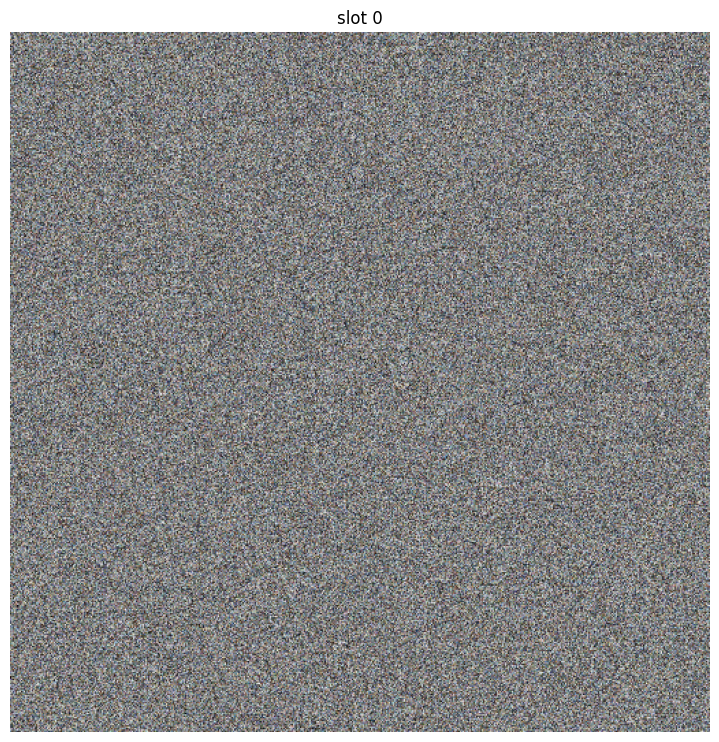

In [3]:
parameterization = Parameterization.image_normal(512)

# Activation maximization initial image
image = parameterization.images 

# Function that transform the image each step of the activation maximization 
function = parameterization.function[0]

plot_all(function(image))

### Activation maximization

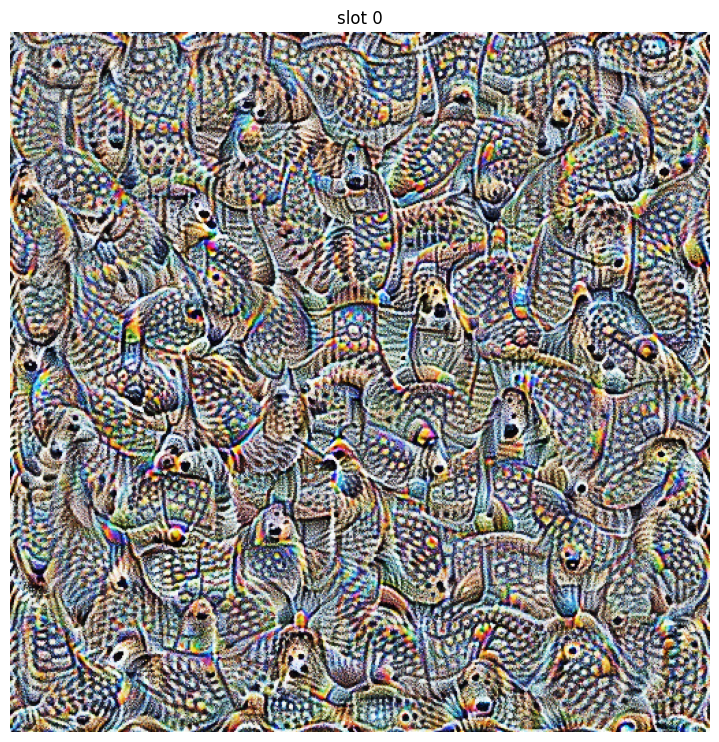

In [4]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, learning_rate = 0.1)

plot_all(images)

# CPPN

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


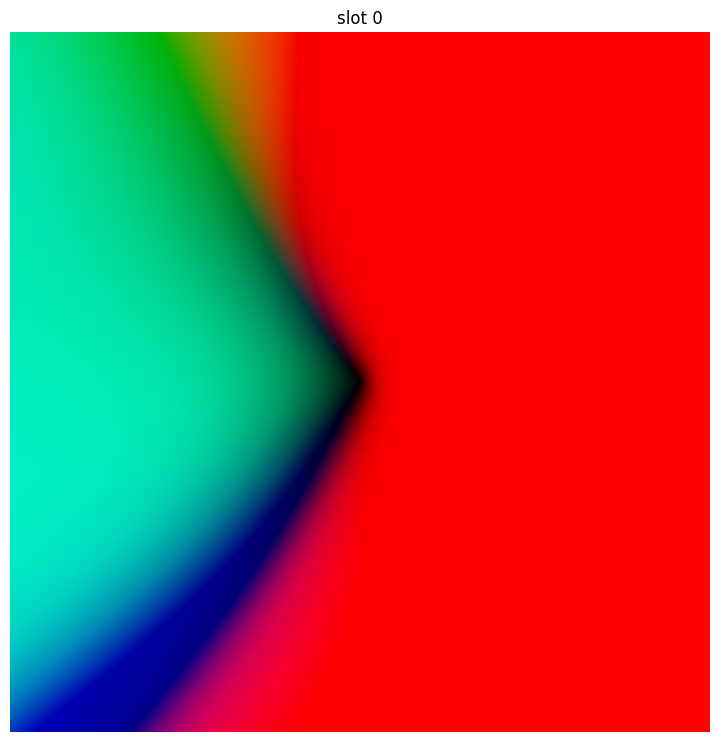

In [3]:
num_hidden_channels = 6
num_layers = 2

parameterization = Parameterization.image_cppn(512,
                                               num_hidden_channels = num_hidden_channels,
                                               num_layers = num_layers,
                                               activation_func = tf.tanh)

# Activation maximization initial image
image = parameterization.images 

plot_all(image)

### Activation maximization

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


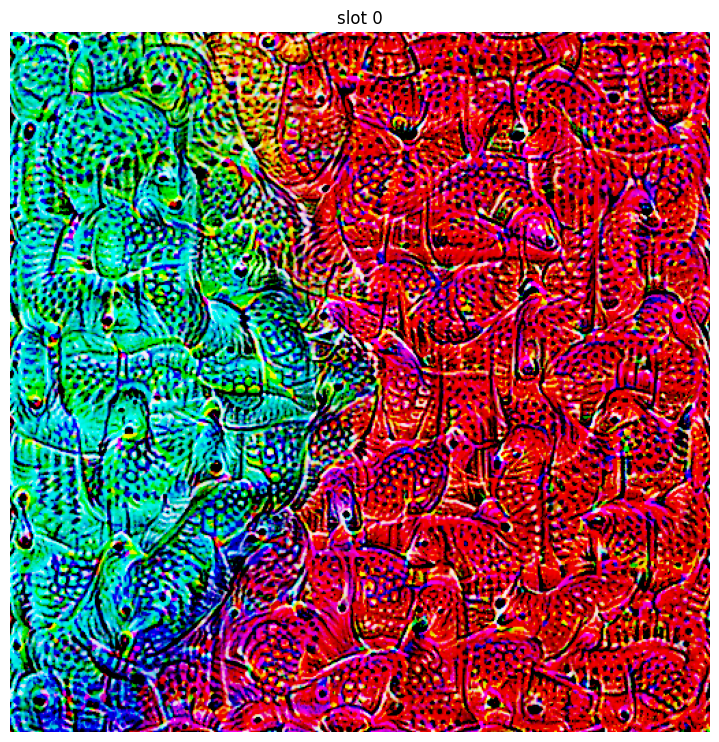

In [5]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.05) # lower learning rate its better for this parameterization

plot_all(images)

# Fast Fourier Transform

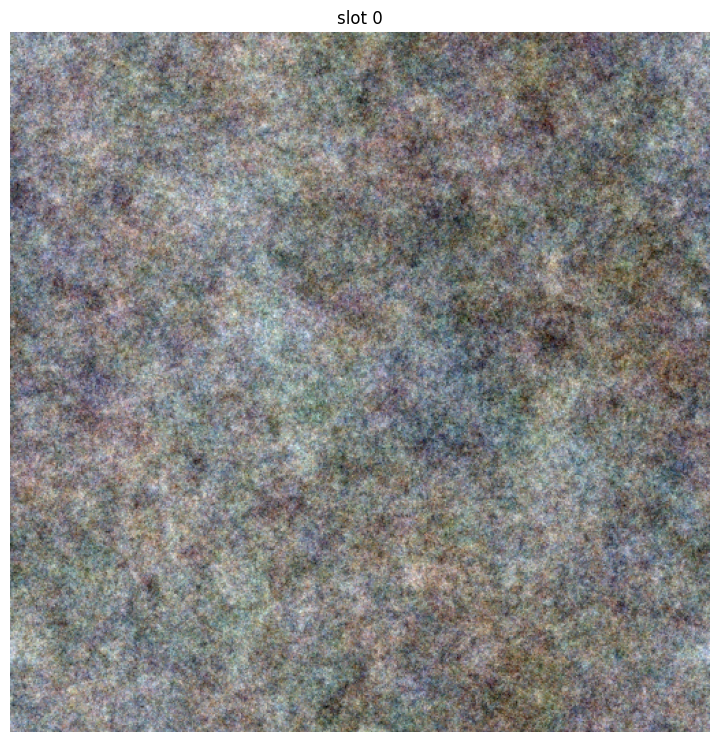

In [7]:
fft_decay = 0.85

parameterization = Parameterization.image_fft(512, fft_decay = fft_decay)

# Activation maximization initial image
image = parameterization.images

fft_scale = get_fft_scale(512, 512, decay_power = fft_decay)

# Function that transform the image each step of the activation maximization 
function = parameterization.function[0]

plot_all([function(image[0])])

### Activation maximization

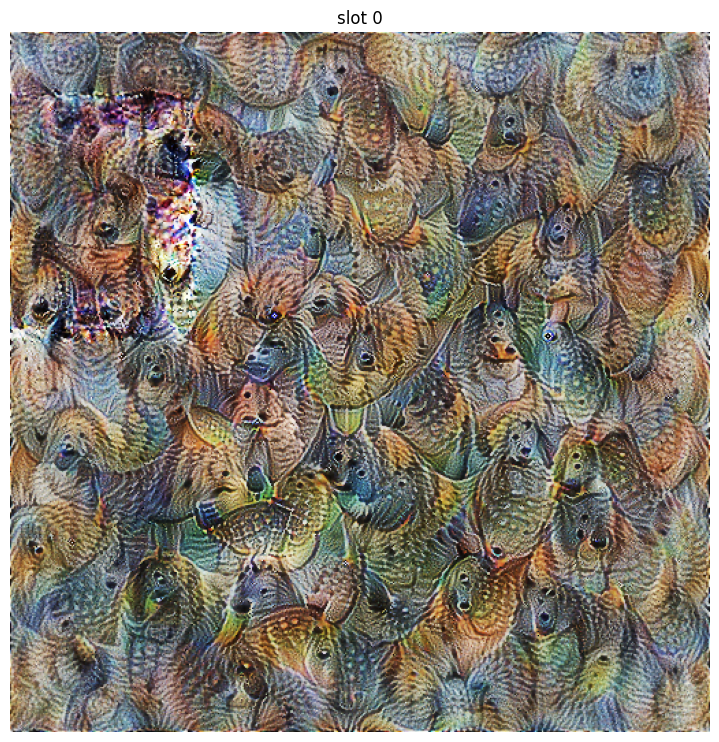

In [8]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.1)

plot_all(images)

# Laplacian_pyramid

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


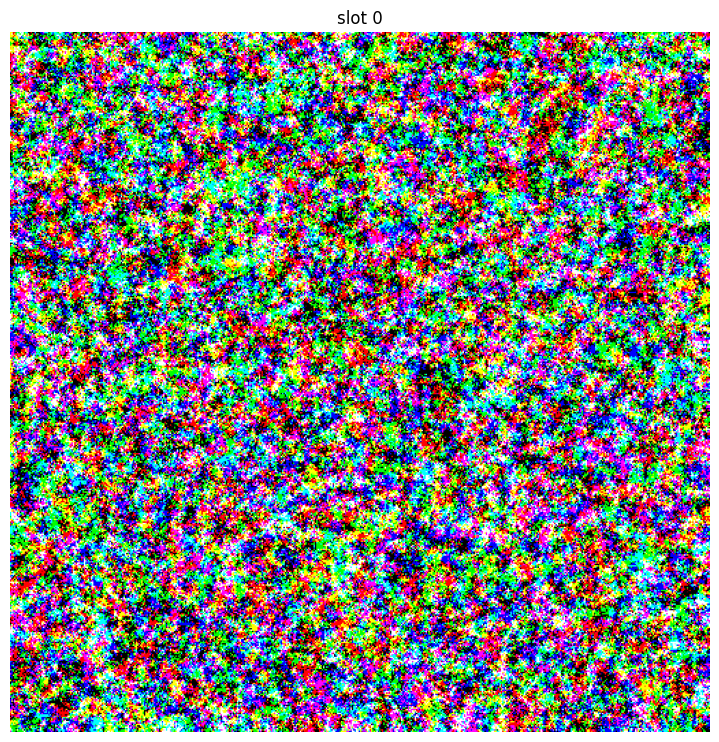

In [9]:
levels = 4

parameterization = Parameterization.image_laplacian_pyramid(512, levels = levels)

# Activation maximization initial image
image = parameterization.images 

plot_all(image)

### Activation maximization

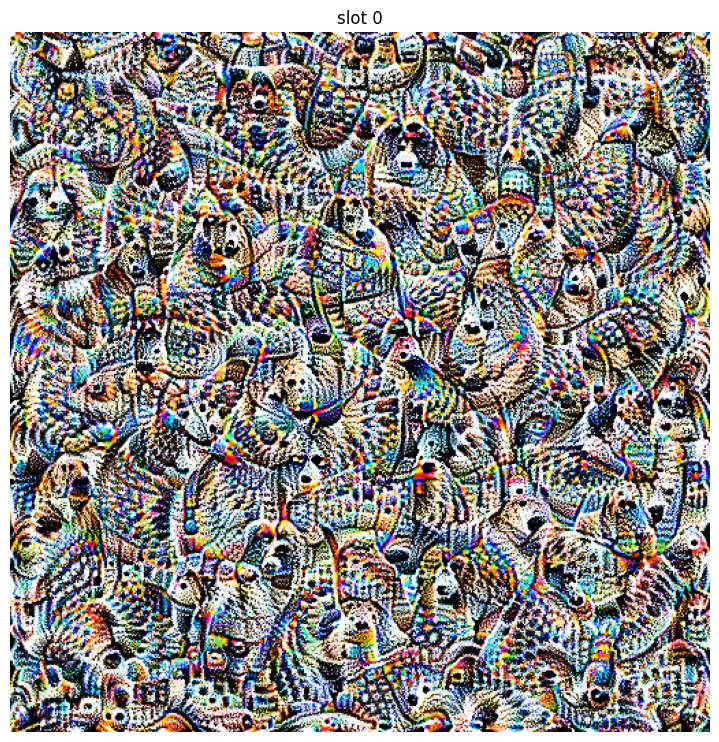

In [10]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.1)

plot_all(images)

# Laplacian Pyramid + Fast Fourier Transform

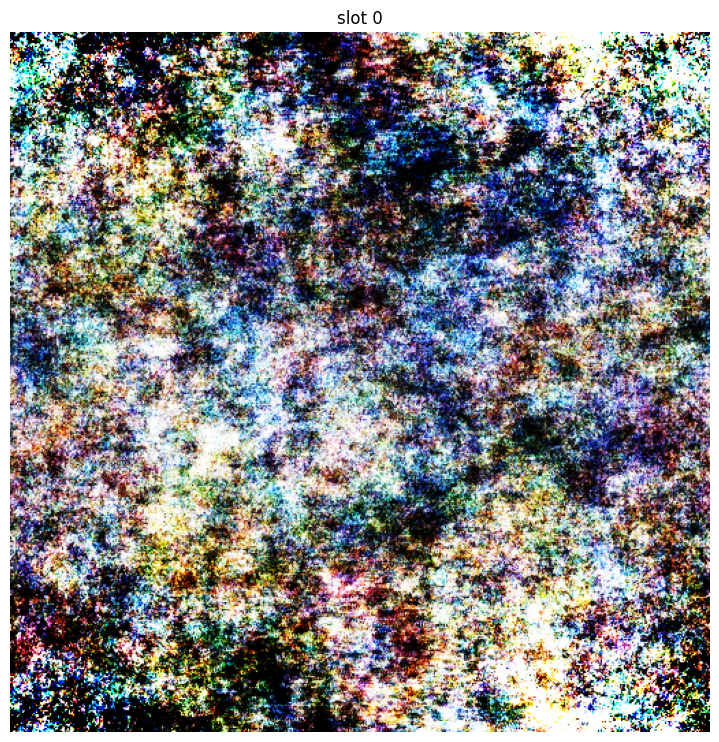

In [11]:
levels = 4
fft_decay = 0.85

parameterization = Parameterization.image_laplacian_pyramid_fft(512,
                                                                levels = levels,
                                                                fft_decay = fft_decay,)

# Activation maximization initial image
image = parameterization.images

fft_scale = get_fft_scale(512, 512, decay_power = fft_decay)

# Function that transform the image each step of the activation maximization 
function = parameterization.function[0]

plot_all([function(image[0])])

### Activation maximization

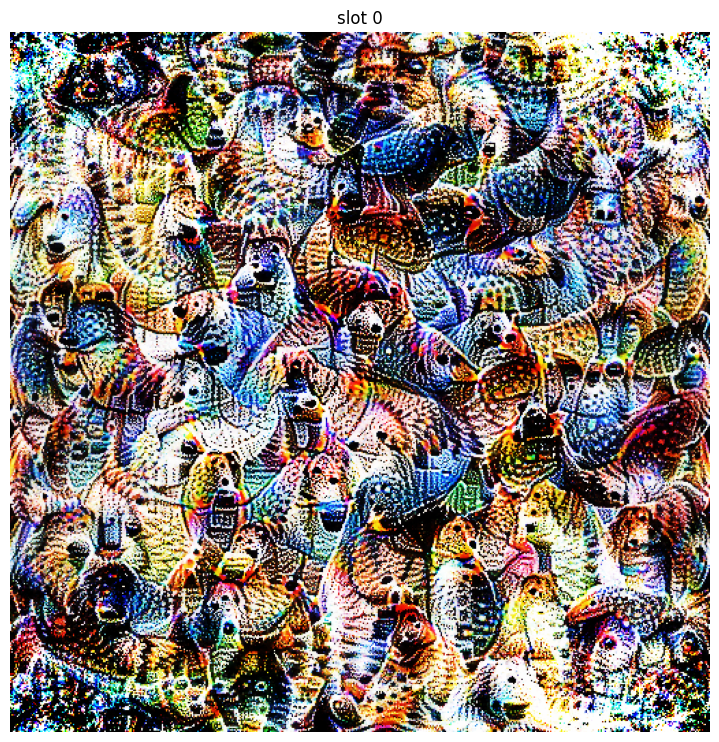

In [12]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.1)

plot_all(images)